In [141]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt

In [161]:
from sklearn.impute import SimpleImputer  #Scikit Learn Imputer  - a free, open-source Python library for machine learning

In [162]:
#reading/Importing data from CSV file to the Pandas Data Frame
df = pd.read_csv('/Users/maruthiganesh/Downloads/covid_19_data.csv') 

In [163]:
df.head(50) #df.head() will return first 5 rows of data

,SNo,ObservationDate,Province/State,Country/Region,Last Update,Confirmed,Deaths,Recovered
0,1,01/22/2020,Anhui,Mainland China,1/22/2020 17:00,1.0,0.0,0.0
1,2,01/22/2020,Beijing,Mainland China,1/22/2020 17:00,14.0,0.0,0.0
2,3,01/22/2020,Chongqing,Mainland China,1/22/2020 17:00,6.0,0.0,0.0
3,4,01/22/2020,Fujian,Mainland China,1/22/2020 17:00,1.0,0.0,0.0
4,5,01/22/2020,Gansu,Mainland China,1/22/2020 17:00,0.0,0.0,0.0
5,6,01/22/2020,Guangdong,Mainland China,1/22/2020 17:00,26.0,0.0,0.0
6,7,01/22/2020,Guangxi,Mainland China,1/22/2020 17:00,2.0,0.0,0.0
7,8,01/22/2020,Guizhou,Mainland China,1/22/2020 17:00,1.0,0.0,0.0
8,9,01/22/2020,Hainan,Mainland China,1/22/2020 17:00,4.0,0.0,0.0
9,10,01/22/2020,Hebei,Mainland China,1/22/2020 17:00,1.0,0.0,0.0


In [164]:
#Cleaning by dropping the unwanted columns of the CSV file
df.drop(['SNo','Last Update'],axis=1,inplace=True)

In [165]:
df.head()  #Will print the query

,ObservationDate,Province/State,Country/Region,Confirmed,Deaths,Recovered
0,01/22/2020,Anhui,Mainland China,1.0,0.0,0.0
1,01/22/2020,Beijing,Mainland China,14.0,0.0,0.0
2,01/22/2020,Chongqing,Mainland China,6.0,0.0,0.0
3,01/22/2020,Fujian,Mainland China,1.0,0.0,0.0
4,01/22/2020,Gansu,Mainland China,0.0,0.0,0.0


In [166]:
df.rename(columns={'ObservationDate':'Date','Province/State':'State','Country/Region':'Country'},inplace=True)
df.head()

,Date,State,Country,Confirmed,Deaths,Recovered
0,01/22/2020,Anhui,Mainland China,1.0,0.0,0.0
1,01/22/2020,Beijing,Mainland China,14.0,0.0,0.0
2,01/22/2020,Chongqing,Mainland China,6.0,0.0,0.0
3,01/22/2020,Fujian,Mainland China,1.0,0.0,0.0
4,01/22/2020,Gansu,Mainland China,0.0,0.0,0.0


In [167]:
#changing the date format to Panadas Data Frame Date Format
df['Date'] = pd.to_datetime(df['Date'])

In [168]:
df.head(10)

,Date,State,Country,Confirmed,Deaths,Recovered
0,2020-01-22,Anhui,Mainland China,1.0,0.0,0.0
1,2020-01-22,Beijing,Mainland China,14.0,0.0,0.0
2,2020-01-22,Chongqing,Mainland China,6.0,0.0,0.0
3,2020-01-22,Fujian,Mainland China,1.0,0.0,0.0
4,2020-01-22,Gansu,Mainland China,0.0,0.0,0.0
5,2020-01-22,Guangdong,Mainland China,26.0,0.0,0.0
6,2020-01-22,Guangxi,Mainland China,2.0,0.0,0.0
7,2020-01-22,Guizhou,Mainland China,1.0,0.0,0.0
8,2020-01-22,Hainan,Mainland China,4.0,0.0,0.0
9,2020-01-22,Hebei,Mainland China,1.0,0.0,0.0


In [169]:
df.describe()  #gives the description like mean count min max deviation etc

,Date,Confirmed,Deaths,Recovered
count,205951,2.059510e+05,205951.000000,2.059510e+05
mean,2020-08-31 05:58:00.542459136,4.540148e+04,1262.633850,2.766348e+04
min,2020-01-22 00:00:00,-3.028440e+05,-178.000000,-8.544050e+05
25%,2020-06-27 00:00:00,5.960000e+02,7.000000,1.100000e+01
50%,2020-09-05 00:00:00,5.361000e+03,101.000000,1.028000e+03
75%,2020-11-13 00:00:00,2.618400e+04,713.000000,9.880000e+03
max,2021-01-19 00:00:00,3.049037e+06,80143.000000,6.399531e+06
std,NaN,1.437216e+05,4082.838603,1.334517e+05


In [170]:
df.info() #gives the details about the null values and non null values in the imported data
#there are null values in CSV ( 1   State      205951 non-null  object        )

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 205951 entries, 0 to 205950
Data columns (total 6 columns):
 #   Column     Non-Null Count   Dtype         
---  ------     --------------   -----         
 0   Date       205951 non-null  datetime64[ns]
 1   State      150571 non-null  object        
 2   Country    205951 non-null  object        
 3   Confirmed  205951 non-null  float64       
 4   Deaths     205951 non-null  float64       
 5   Recovered  205951 non-null  float64       
dtypes: datetime64[ns](1), float64(3), object(2)
memory usage: 9.4+ MB


In [171]:
df = df.fillna('NA') #fills the missing values with NA (Not Available)

In [172]:
df.info()  #null values are filled ( 1   State      205951 non-null  object        )

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 205951 entries, 0 to 205950
Data columns (total 6 columns):
 #   Column     Non-Null Count   Dtype         
---  ------     --------------   -----         
 0   Date       205951 non-null  datetime64[ns]
 1   State      205951 non-null  object        
 2   Country    205951 non-null  object        
 3   Confirmed  205951 non-null  float64       
 4   Deaths     205951 non-null  float64       
 5   Recovered  205951 non-null  float64       
dtypes: datetime64[ns](1), float64(3), object(2)
memory usage: 9.4+ MB


In [173]:
df.head(10)

,Date,State,Country,Confirmed,Deaths,Recovered
0,2020-01-22,Anhui,Mainland China,1.0,0.0,0.0
1,2020-01-22,Beijing,Mainland China,14.0,0.0,0.0
2,2020-01-22,Chongqing,Mainland China,6.0,0.0,0.0
3,2020-01-22,Fujian,Mainland China,1.0,0.0,0.0
4,2020-01-22,Gansu,Mainland China,0.0,0.0,0.0
5,2020-01-22,Guangdong,Mainland China,26.0,0.0,0.0
6,2020-01-22,Guangxi,Mainland China,2.0,0.0,0.0
7,2020-01-22,Guizhou,Mainland China,1.0,0.0,0.0
8,2020-01-22,Hainan,Mainland China,4.0,0.0,0.0
9,2020-01-22,Hebei,Mainland China,1.0,0.0,0.0


In [174]:
df2 = df.groupby('Country')[['Confirmed','Deaths','Recovered']].sum().reset_index()

In [175]:
df2 = df.groupby(['Country','Date'])[['Confirmed','Deaths','Recovered']].sum().reset_index()

In [176]:
df2.head(10)

,Country,Date,Confirmed,Deaths,Recovered
0,Azerbaijan,2020-02-28,1.0,0.0,0.0
1,"('St. Martin',)",2020-03-10,2.0,0.0,0.0
2,Afghanistan,2020-02-24,1.0,0.0,0.0
3,Afghanistan,2020-02-25,1.0,0.0,0.0
4,Afghanistan,2020-02-26,1.0,0.0,0.0
5,Afghanistan,2020-02-27,1.0,0.0,0.0
6,Afghanistan,2020-02-28,1.0,0.0,0.0
7,Afghanistan,2020-02-29,1.0,0.0,0.0
8,Afghanistan,2020-03-01,1.0,0.0,0.0
9,Afghanistan,2020-03-02,1.0,0.0,0.0


In [177]:
df3 = df2[df2['Confirmed']>100]

In [178]:
df3

,Country,Date,Confirmed,Deaths,Recovered
35,Afghanistan,2020-03-28,107.0,4.0,2.0
36,Afghanistan,2020-03-29,118.0,4.0,2.0
37,Afghanistan,2020-03-30,146.0,4.0,2.0
38,Afghanistan,2020-03-31,175.0,4.0,5.0
39,Afghanistan,2020-04-01,197.0,4.0,5.0
...,...,...,...,...,...
61508,Zimbabwe,2021-01-15,26109.0,666.0,15414.0
61509,Zimbabwe,2021-01-16,26881.0,683.0,15872.0
61510,Zimbabwe,2021-01-17,27203.0,713.0,16512.0
61511,Zimbabwe,2021-01-18,27892.0,773.0,17372.0


In [183]:
countries = df3['Country'].unique()
len(countries)

183

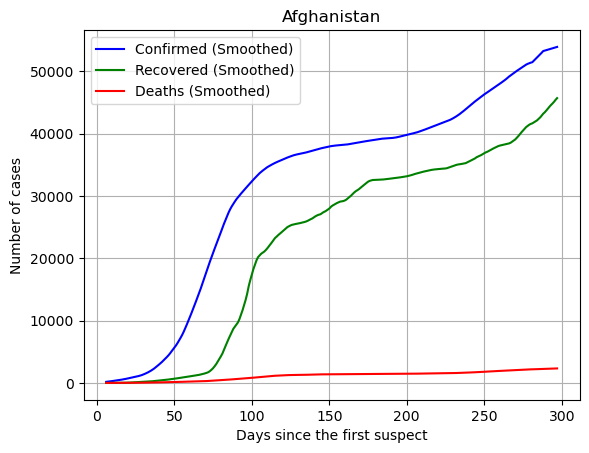

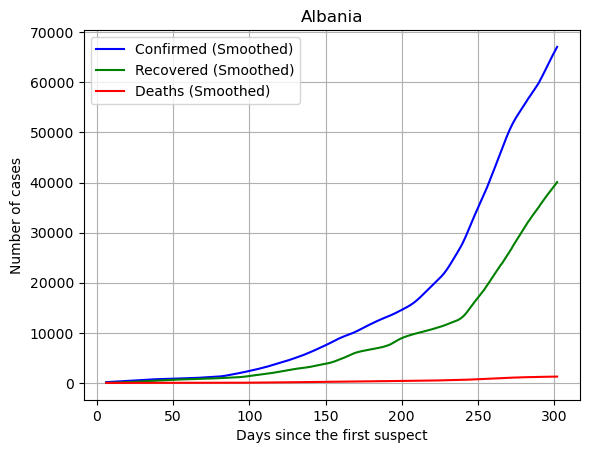

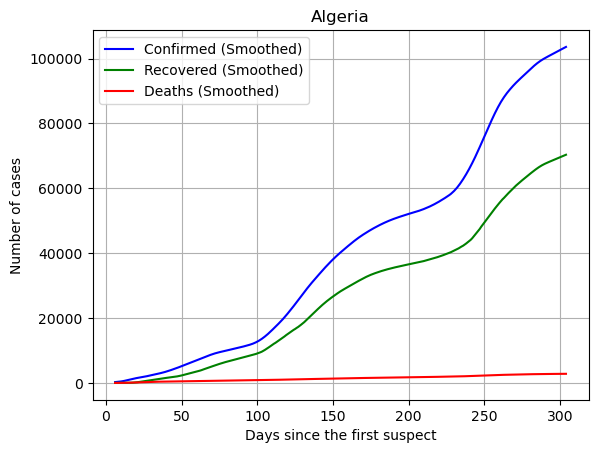

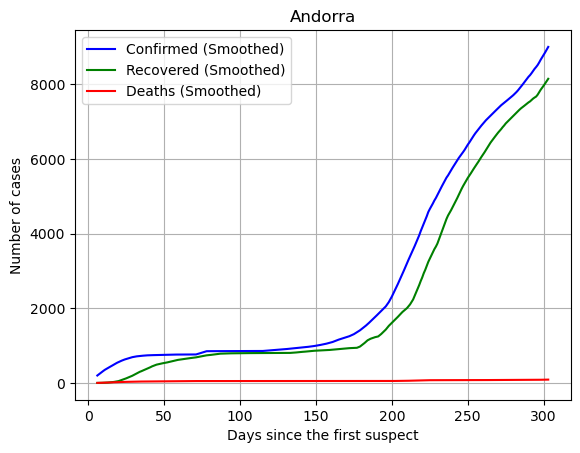

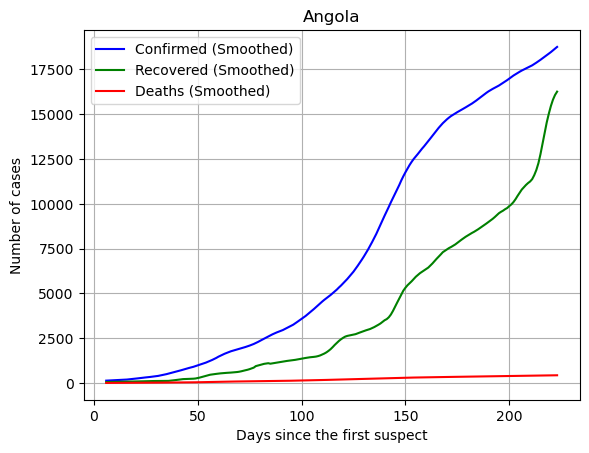

...

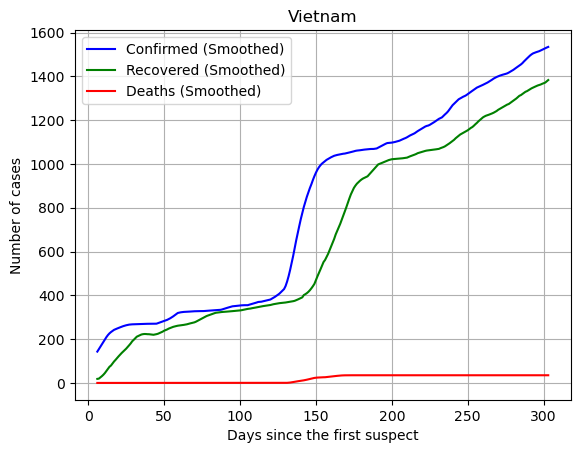

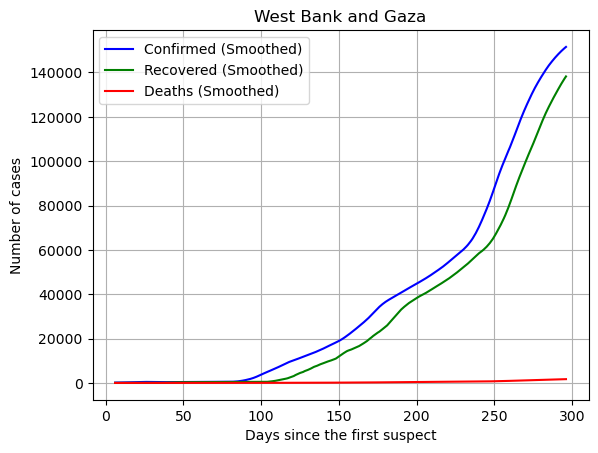

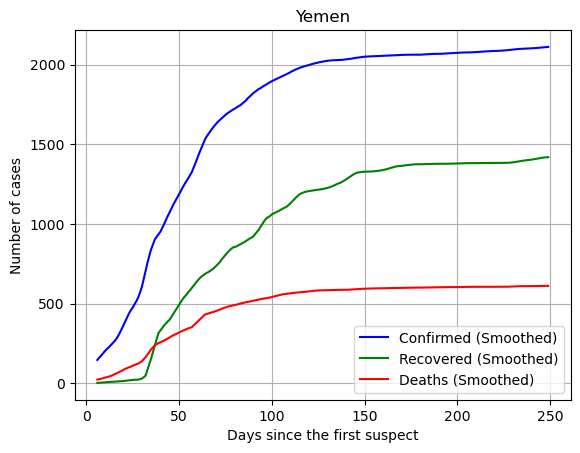

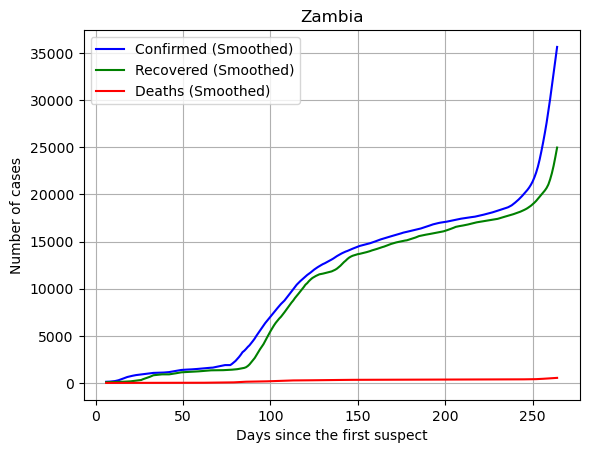

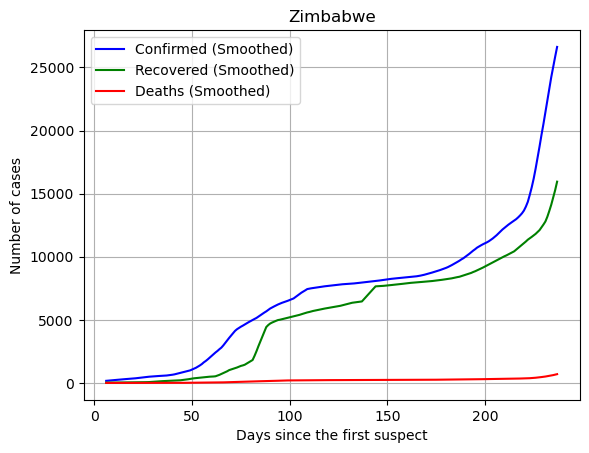

In [189]:
for idx in range(0, len(countries)):
    C = df3[df3['Country'] == countries[idx]].reset_index()

    window = 7 # Adjust the window size for smoothing
    C['Confirmed_smooth'] = C['Confirmed'].rolling(window=window).mean()
    C['Recovered_smooth'] = C['Recovered'].rolling(window=window).mean()
    C['Deaths_smooth'] = C['Deaths'].rolling(window=window).mean()

    plt.plot(np.arange(0, len(C)), C['Confirmed_smooth'], color='blue', label='Confirmed (Smoothed)', linestyle='-')
    plt.plot(np.arange(0, len(C)), C['Recovered_smooth'], color='green', label='Recovered (Smoothed)', linestyle='-')
    plt.plot(np.arange(0, len(C)), C['Deaths_smooth'], color='red', label='Deaths (Smoothed)', linestyle='-')

    plt.title(countries[idx])
    plt.xlabel('Days since the first suspect')
    plt.ylabel('Number of cases')
    plt.legend()
    plt.grid(True)
    plt.show()